In [1]:
import csv
import io
import requests
from PIL import Image
from torch.utils.data import Dataset

def build_caption(title, tags):
    title = str(title).strip()
    tags = str(tags).strip()

    # remove 'glasgow' from tags, keep first 3
    tag_list = [t for t in tags.split() if t.lower() != "glasgow"]
    extra = " ".join(tag_list[:3])

    return f"{title}. {extra}".strip(". ").strip()



In [35]:
import pandas as pd
import glob

# Path with wildcard – this is the correct way!
folder_path = "/home/staff3/fstachurski/Flickr_data"   # CHANGE THIS TO YOUR ACTUAL PATH
excel_files = glob.glob(f"{folder_path}/west_end_*_df_flickr.xlsx")

print(f"Found {len(excel_files)} files:")
for f in excel_files:
    print("  ", f)

# Read and concatenate all files
dfs = [pd.read_excel(f) for f in excel_files]
df = pd.concat(dfs, ignore_index=True)

print("\nCombined DataFrame shape:", df.shape)
print("Columns:")
print(df.columns.tolist())
print("\nFirst few rows:")
print(df.head())
df = df.sample(100).reset_index(drop=True)

Found 6 files:
   /home/staff3/fstachurski/Flickr_data/west_end_2025-08-09_df_flickr.xlsx
   /home/staff3/fstachurski/Flickr_data/west_end_2025-08-28_df_flickr.xlsx
   /home/staff3/fstachurski/Flickr_data/west_end_2025-09-26_df_flickr.xlsx
   /home/staff3/fstachurski/Flickr_data/west_end_2025-06-27_df_flickr.xlsx
   /home/staff3/fstachurski/Flickr_data/west_end_2025-11-11_df_flickr.xlsx
   /home/staff3/fstachurski/Flickr_data/west_end_2025-10-24_df_flickr.xlsx

Combined DataFrame shape: (40438, 70)
Columns:
['id', 'owner', 'secret', 'server', 'farm', 'title', 'ispublic', 'isfriend', 'isfamily', 'license', 'description', 'dateupload', 'lastupdate', 'datetaken', 'datetakengranularity', 'datetakenunknown', 'ownername', 'iconserver', 'iconfarm', 'views', 'tags', 'machine_tags', 'latitude', 'longitude', 'accuracy', 'context', 'place_id', 'woeid', 'geo_is_public', 'geo_is_contact', 'geo_is_friend', 'geo_is_family', 'media', 'media_status', 'url_sq', 'height_sq', 'width_sq', 'url_t', 'height_

In [36]:
def load_items_from_df(df):
    items = []

    for _, row in df.iterrows():
        # pick a usable URL: prefer url_l, then url_c, then url_o
        url = None
        for col in ["url_l", "url_c", "url_o"]:
            if col in df.columns:
                val = row.get(col)
                if isinstance(val, str) and val.startswith("http"):
                    url = val
                    break

        if url is None:
            continue  # skip rows with no usable URL

        title = row.get("title", "")
        tags = row.get("tags", "")

        caption = build_caption(title, tags)

        items.append({
            "image_url": url,
            "caption": caption,
        })

    return items

_items = load_items_from_df(df)
print("Loaded items:", len(_items))
print(_items[0])

 

Loaded items: 99
{'image_url': 'https://live.staticflickr.com/5016/5532603506_782462919c_b.jpg', 'caption': 'Doorway. cathedral saintmarys stmarys'}


In [37]:
import requests

def check_flickr_url(url: str) -> dict:
    """Check whether a Flickr static URL returns a real image."""
    headers = {
        "User-Agent": "Mozilla/5.0 (compatible; flickr-url-checker/1.0)"
    }
    
    try:
        resp = requests.get(url, timeout=8, headers=headers)

        # If not 200, it's invalid
        if resp.status_code != 200:
            return {
                "status": resp.status_code,
                "ok_image": False,
                "message": "Non-200 status"
            }

        content_type = resp.headers.get("Content-Type", "")

        # Flickr invalid URL => HTML page w/ the droids message
        droids = b"These aren't the droids you're looking for" in resp.content

        # Check if it's an actual image
        is_image = ("image" in content_type.lower()) and not droids

        return {
            "status": resp.status_code,
            "ok_image": is_image,
            "droids_page": droids,
            "content_type": content_type,
        }

    except Exception as e:
        return {
            "status": None,
            "ok_image": False,
            "droids_page": False,
            "content_type": "",
            "error": str(e),
        }

In [38]:
# Run checks
results = []
for item in _items:
    res = check_flickr_url(item["image_url"])
    item.update(res)
    results.append(item)

_items = results

In [39]:
# After filtering the non responsive URLs

print(len(_items))

99


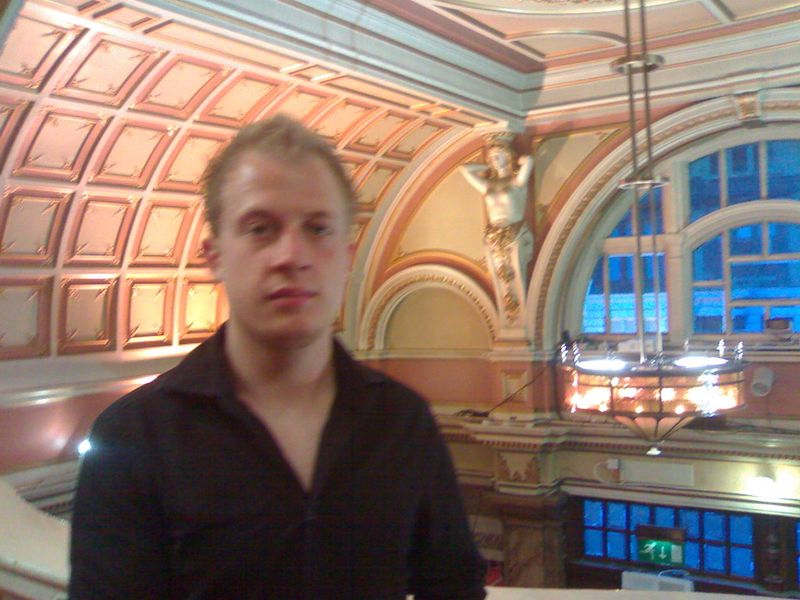

pic n = 5; -> La Bohème. cameraphone show uk


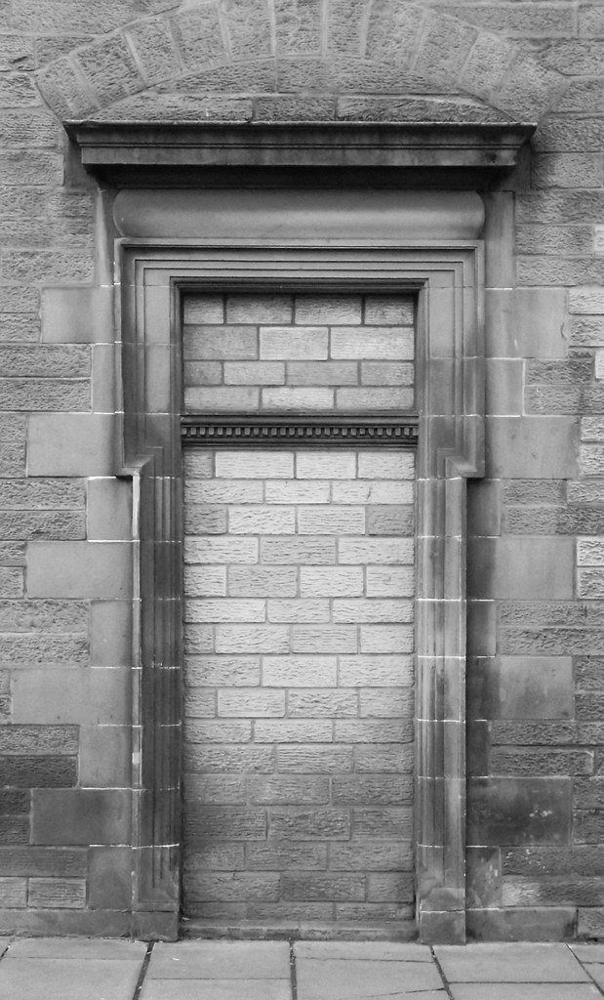

pic n = 89; -> this is an ex door. door blackandwhite bw


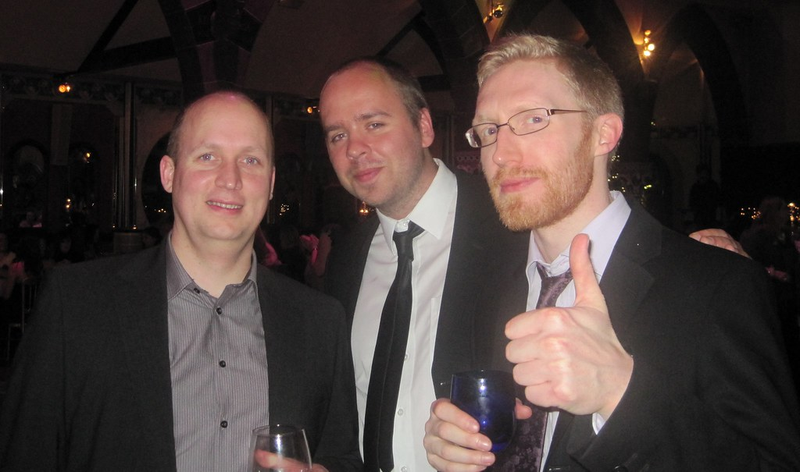

pic n = 63; -> Office Christmas Party 2009. party westend equator


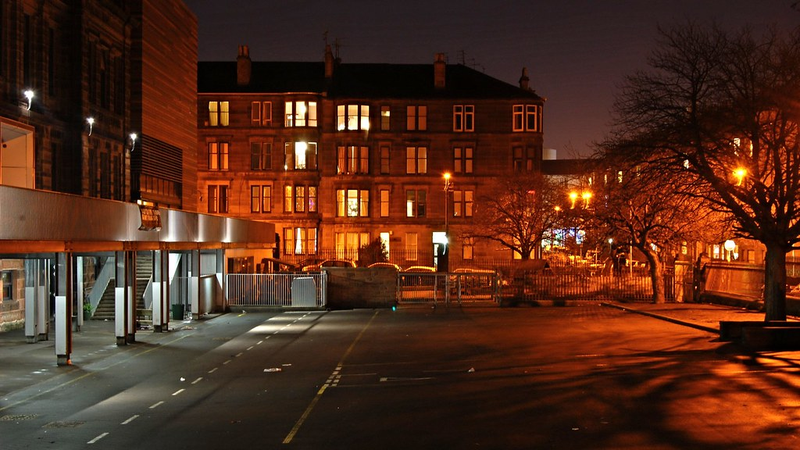

pic n = 60; -> Tenement and school. scotland westend school


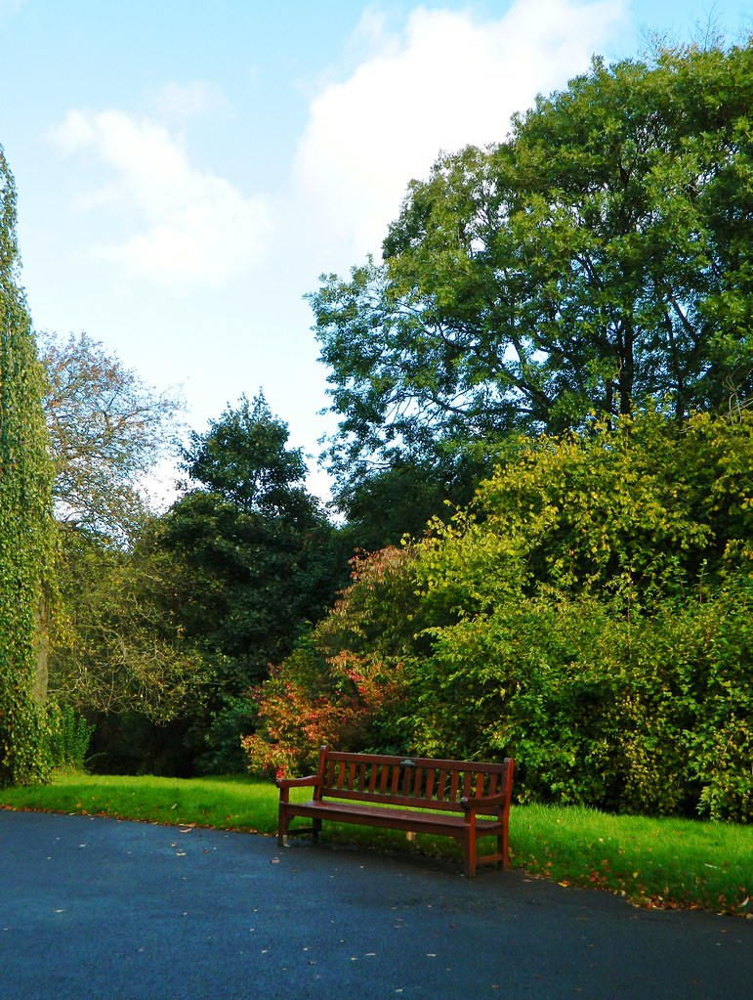

pic n = 17; -> Botanic Garden's Glasgow. flowers autumn cactus


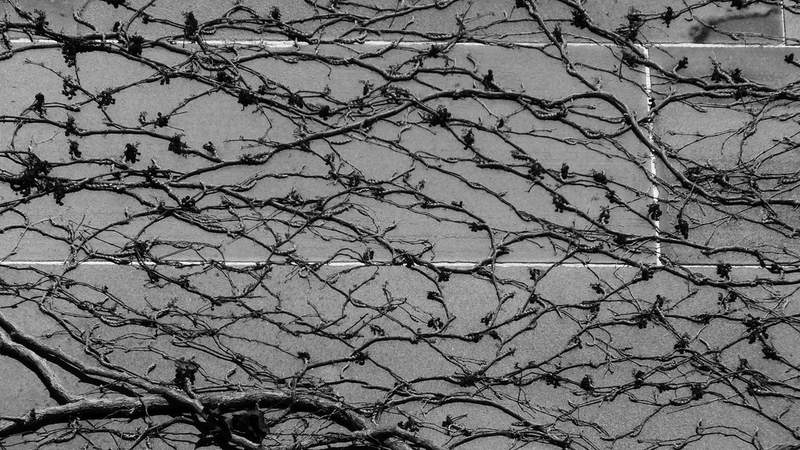

pic n = 18; -> Enveloping. blackandwhite blackwhite bw


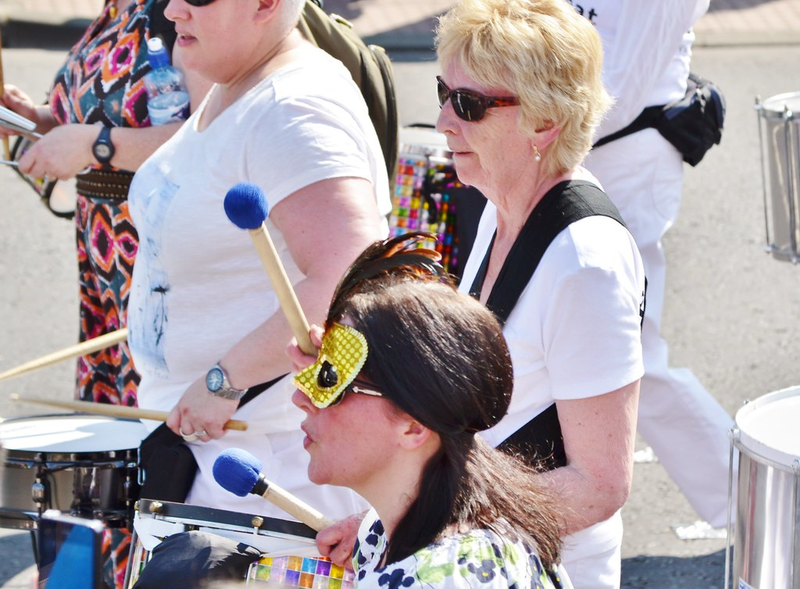

pic n = 98; -> Glasgow West End Festival 2013. carnival summer people


In [40]:
import requests
from PIL import Image
from io import BytesIO
import numpy as np
from IPython.display import display

for i in range(len(_items)):
    n = np.random.randint(len(_items))
    response = requests.get(_items[n]["image_url"], timeout=20)
    img = Image.open(BytesIO(response.content))
    
    # Resize huge images so the notebook doesn’t explode
    if img.width > 800:
        ratio = 800 / img.width
        new_size = (800, int(img.height * ratio))
        img = img.resize(new_size, Image.Resampling.LANCZOS)
    
    display(img)                                      
    print("pic n = {}; -> {}".format(n, _items[n]["caption"]))
    
    if i > 5: 
        break

In [41]:
import io
import requests
from PIL import Image
from torch.utils.data import Dataset

class CaptionDataset(Dataset):
    def __init__(self, items, processor, max_length=32):
        self.items = items
        self.processor = processor
        self.max_length = max_length

    def __len__(self):
        return len(self.items)

    def _load_image(self, url):
        resp = requests.get(url, timeout=10)
        resp.raise_for_status()
        return Image.open(io.BytesIO(resp.content)).convert("RGB")

    def __getitem__(self, idx):
        item = self.items[idx]
        image = self._load_image(item["image_url"])
        caption = item["caption"]

        inputs = self.processor(
            images=image,
            text=caption,
            return_tensors="pt",
            padding="max_length",
            truncation=True,
            max_length=self.max_length,
        )
        inputs["labels"] = inputs["input_ids"].clone()
        inputs = {k: v.squeeze(0) for k, v in inputs.items()}
        return inputs


In [42]:
### Testing BLIP

import torch
from transformers import BlipForConditionalGeneration, AutoProcessor

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

model_name = "Salesforce/blip-image-captioning-base"
processor = AutoProcessor.from_pretrained(model_name)
model = BlipForConditionalGeneration.from_pretrained(model_name).to(device)
model.eval()


Device: cuda


BlipForConditionalGeneration(
  (vision_model): BlipVisionModel(
    (embeddings): BlipVisionEmbeddings(
      (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (encoder): BlipEncoder(
      (layers): ModuleList(
        (0-11): 12 x BlipEncoderLayer(
          (self_attn): BlipAttention(
            (dropout): Dropout(p=0.0, inplace=False)
            (qkv): Linear(in_features=768, out_features=2304, bias=True)
            (projection): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): BlipMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
      )
    )
    (post_layernorm): LayerNorm((768,), eps=1e-0

In [43]:
import io
import requests
from PIL import Image

def load_image_from_url(url):
    resp = requests.get(url, timeout=10)
    resp.raise_for_status()
    return Image.open(io.BytesIO(resp.content)).convert("RGB")


def blip_caption_from_url(url, prompt=" "):
    """
    prompt can be generic ('a photo of') or domain-specific
    like 'A street in  Glasgow:'.
    """
    image = load_image_from_url(url)
    inputs = processor(images=image, text=prompt, return_tensors="pt").to(device)

    with torch.no_grad():
        out = model.generate(
            **inputs,
            max_new_tokens=30,
            num_beams=5,
            do_sample=False,
        )

    caption = processor.decode(out[0], skip_special_tokens=True)
    return caption


In [44]:
# Filter rows with a valid URL
df_ = df[~df["url_l"].isna()].reset_index(drop=True)

for i in range(5):  # first 5 examples
    row = df_.iloc[i]
    url = row["url_l"]
    title = row.get("title", "")

    print(f"\n=== Image {i} ===")
    print("Flickr title:", title)
    print("URL:", url)

    # generic prompt
    cap_generic = blip_caption_from_url(url, prompt=" ")
    print("BLIP caption (generic):", cap_generic)



=== Image 0 ===
Flickr title: Doorway
URL: https://live.staticflickr.com/5016/5532603506_782462919c_b.jpg
BLIP caption (generic): an old building with a wooden door in front of it

=== Image 1 ===
Flickr title: Take A Pew
URL: https://live.staticflickr.com/7006/6750319499_cbd6139699_b.jpg
BLIP caption (generic): a blue bench sitting on the side of a road

=== Image 2 ===
Flickr title: Cyclists - Glasgow West end festival
URL: https://live.staticflickr.com/3297/3644450074_36bafc3e02_b.jpg
BLIP caption (generic): a boy doing a trick on a bike at a skate park

=== Image 3 ===
Flickr title: going underground
URL: https://live.staticflickr.com/4322/35941407580_3d22ab7d44_b.jpg
BLIP caption (generic): a black and white photo of a train in a subway station

=== Image 4 ===
Flickr title: Flamenco Dancers
URL: https://live.staticflickr.com/479/18625022598_a809a572fa_b.jpg
BLIP caption (generic): a group of people are dancing in the street


In [45]:
import torch
print(torch.__version__)                  # should say 2.3.1+cu118
print(torch.cuda.is_available())          # True
print(torch.cuda.get_device_name(0))      # Quadro P4000
print(torch.cuda.get_device_capability(0))# (6, 1) ← now accepted

2.6.0+cu118
True
Quadro P4000
(6, 1)


In [46]:
import io
import requests
from PIL import Image
from torch.utils.data import Dataset

def build_caption_from_row(row):
    title = str(row.get("title", "")).strip()
    tags = str(row.get("tags", "")).strip() if "tags" in row else ""
    tags_list = [t for t in tags.split() if t.lower() != "glasgow"]
    extra = " ".join(tags_list[:3])
    if extra:
        return f"{title}, {extra}."
    else:
        return f"{title}"

class ImageCaptioningDataset(Dataset):
    def __init__(self, df, processor):
        self.df = df.reset_index(drop=True)
        self.processor = processor

    def __len__(self):
        return len(self.df)

    def _load_image(self, url):
        try:
            resp = requests.get(url, timeout=10)
            resp.raise_for_status()
            return Image.open(io.BytesIO(resp.content)).convert("RGB")
        except Exception as e:
            # If network/DNS fails, raise a clear error so caller can skip
            raise RuntimeError(f"Failed to load image from {url}: {e}")

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        url = row["url_l"]
        image = self._load_image(url)   # may raise RuntimeError
        text  = build_caption_from_row(row)
        return {"image": image, "text": text}


In [47]:
from torch.utils.data import DataLoader


train_dataset = ImageCaptioningDataset(df_, processor)

# sanity check: MUST print keys 'image' and 'text'
sample = train_dataset[0]
print(sample.keys())          # expect: dict_keys(['image', 'text'])
print(type(sample["image"]))  # expect: <class 'PIL.Image.Image'>
print(sample["text"])         # caption string


dict_keys(['image', 'text'])
<class 'PIL.Image.Image'>
Doorway, cathedral saintmarys stmarys.


In [48]:
import torch
from transformers import AutoModelForVision2Seq, AutoProcessor
from peft import LoraConfig, get_peft_model

device = "cuda" if torch.cuda.is_available() else "cpu"
model_id = "Salesforce/blip-image-captioning-base"

# BLIP as a generic Vision2Seq model
model = AutoModelForVision2Seq.from_pretrained(
    model_id,
    dtype=torch.float16 if device == "cuda" else torch.float32,
).to(device)

processor = AutoProcessor.from_pretrained(model_id)

# Freeze base params
for p in model.parameters():
    p.requires_grad = False

# LoRA config – pattern taken from the working BLIP+PEFT tutorial :contentReference[oaicite:1]{index=1}
lora_config = LoraConfig(
    r=8,
    lora_alpha=16,
    lora_dropout=0.1,
    bias="none",
    target_modules=[
        "self.query",
        "self.key",
        "self.value",
        "output.dense",
        "self_attn.qkv",
        "self_attn.projection",
        "mlp.fc1",
        "mlp.fc2",
    ],
    # NOTE: no task_type here – let PEFT pick the right wrapper
)

model = get_peft_model(model, lora_config)
model.print_trainable_parameters()


/home/staff3/fstachurski/miniconda3/envs/GALLANT-WS3/lib/python3.11/site-packages/transformers/models/auto/modeling_auto.py:2284: FutureWarning: The class `AutoModelForVision2Seq` is deprecated and will be removed in v5.0. Please use `AutoModelForImageTextToText` instead.
  warnings.warn(


trainable params: 2,727,936 || all params: 226,699,580 || trainable%: 1.2033


In [49]:
import torch

def _collator(batch):
    if len(batch) == 0:
        return None  # entire batch is broken

    # batch is a list of {"image": PIL, "text": str}
    images = [item["image"] for item in batch]
    texts  = [item["text"]  for item in batch]

    image_inputs = processor(
        images=images,
        padding="max_length",
        return_tensors="pt",
    )

    text_inputs = processor.tokenizer(
        texts,
        padding=True,
        return_tensors="pt",
    )

    

    return {
        "pixel_values": image_inputs["pixel_values"],
        "input_ids": text_inputs["input_ids"],
        "attention_mask": text_inputs["attention_mask"],
    }



In [50]:
test_batch = _collator([train_dataset[0], train_dataset[1]])
print(test_batch.keys())           # pixel_values, input_ids, attention_mask
print(test_batch["pixel_values"].shape)  # torch.Size([2, 3, H, W])
print(test_batch["input_ids"].shape)     # torch.Size([2, L])


dict_keys(['pixel_values', 'input_ids', 'attention_mask'])
torch.Size([2, 3, 384, 384])
torch.Size([2, 12])


In [54]:
train_loader = DataLoader(
    train_dataset,
    batch_size=8,
    shuffle=True,
    collate_fn=_collator,
)

batch = next(iter(train_loader))
print(batch.keys())
# expect: dict_keys(['pixel_values', 'input_ids', 'attention_mask'])



dict_keys(['pixel_values', 'input_ids', 'attention_mask'])


In [55]:
from torch.optim import AdamW
from tqdm import tqdm # for progress bar

optimizer = AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=5e-5)
num_epochs = 3
model.train()

losses = {'train_loss': []}

for epoch in range(num_epochs):
    temp_loss = []
    print(f"\n=== Epoch {epoch} ===")
    try:
        for step, batch in tqdm(enumerate(train_loader), desc="Training steps", leave=False):

            # Skip invalid batches
            if batch is None:
                continue

            
            input_ids      = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            pixel_values   = batch["pixel_values"].to(device)

            outputs = model(
                input_ids=input_ids,
                pixel_values=pixel_values,
                labels=input_ids,
                attention_mask=attention_mask,
            )

            loss = outputs.loss
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            temp_loss.append(loss.item())

    except Exception as e:
        print(f"[WARN] Skipping batch {step} due to error: {e}")
        continue  # <- SKIP the bad batch



    avg_loss = sum(temp_loss) / len(temp_loss)
    losses['train_loss'].append(avg_loss)

    print(f"  epoch {epoch} || Average training loss: {avg_loss:.4f}")





=== Epoch 0 ===


Training steps: 0it [00:00, ?it/s]

  epoch 0 || Average training loss: 8.3951

=== Epoch 1 ===


  epoch 1 || Average training loss: 8.6923

=== Epoch 2 ===


  epoch 2 || Average training loss: 7.9955


In [56]:
losses['train_loss']


[8.395132211538462, 8.692307692307692, 7.995492788461538]

Matplotlib is building the font cache; this may take a moment.


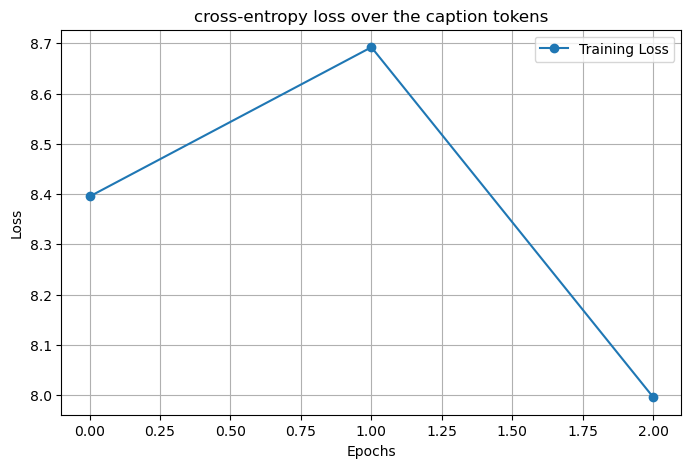

In [57]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 5))
plt.plot(losses['train_loss'], marker='o'  , label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('cross-entropy loss over the caption tokens')
plt.legend()
plt.grid(True)
plt.show()

In [58]:
# Get base model again: import torch
from transformers import AutoModelForVision2Seq, AutoProcessor

device = "cuda" if torch.cuda.is_available() else "cpu"
model_id = "Salesforce/blip-image-captioning-base"

# processor (reuse your existing one if you already have it)
processor = AutoProcessor.from_pretrained(model_id)

# 1) Base BLIP (no adaptation)
base_model = AutoModelForVision2Seq.from_pretrained(
    model_id,
    dtype=torch.float16 if device == "cuda" else torch.float32,
).to(device)

base_model.eval()

# 2) LoRA-adapted model (reuse your trained model if you have it)
yorkhill_model = model  # assuming 'model' is your trained LoRA-adapted model
yorkhill_model.eval()



/home/staff3/fstachurski/miniconda3/envs/GALLANT-WS3/lib/python3.11/site-packages/transformers/models/auto/modeling_auto.py:2284: FutureWarning: The class `AutoModelForVision2Seq` is deprecated and will be removed in v5.0. Please use `AutoModelForImageTextToText` instead.
  warnings.warn(


PeftModel(
  (base_model): LoraModel(
    (model): BlipForConditionalGeneration(
      (vision_model): BlipVisionModel(
        (embeddings): BlipVisionEmbeddings(
          (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
        )
        (encoder): BlipEncoder(
          (layers): ModuleList(
            (0-11): 12 x BlipEncoderLayer(
              (self_attn): BlipAttention(
                (dropout): Dropout(p=0.0, inplace=False)
                (qkv): lora.Linear(
                  (base_layer): Linear(in_features=768, out_features=2304, bias=True)
                  (lora_dropout): ModuleDict(
                    (default): Dropout(p=0.1, inplace=False)
                  )
                  (lora_A): ModuleDict(
                    (default): Linear(in_features=768, out_features=8, bias=False)
                  )
                  (lora_B): ModuleDict(
                    (default): Linear(in_features=8, out_features=2304, bias=False)
                  )
 

In [59]:
import io
import requests
from PIL import Image

def load_image_from_url(url: str):
    resp = requests.get(url, timeout=10)
    resp.raise_for_status()
    return Image.open(io.BytesIO(resp.content)).convert("RGB")

def generate_caption(model, url: str, prompt: str = " "):
    image = load_image_from_url(url)
    inputs = processor(images=image, text=prompt, return_tensors="pt").to(device)
    with torch.no_grad():
        out = model.generate(
            **inputs,
            max_new_tokens=30,
            num_beams=5,
            no_repeat_ngram_size=3,
            repetition_penalty=1.2,
        )
    return processor.decode(out[0], skip_special_tokens=True)


In [60]:
# just to be sure we’re using rows with a valid url_l
test_df = df_.reset_index(drop=True)

for i in range(15):  # first 5 examples
    n = np.random.randint(len(test_df))
    row = test_df.iloc[n]
    url = row["url_l"]
    title = str(row.get("title", ""))

    print(f"\n=== Example {i} ===")
    print("Flickr title:", title)
    print("URL:", url)

    base_cap = generate_caption(base_model, url)
    york_cap = generate_caption(yorkhill_model, url)

    print("Base BLIP:    ", base_cap)
    print("LoRA:", york_cap)



=== Example 0 ===
Flickr title: Glasgow West End Festival 2013
URL: https://live.staticflickr.com/5463/9009986690_272184a2d1_b.jpg
Base BLIP:     a woman playing a guitar in front of a store
LoRA: a woman playing a guitar in front of a store

=== Example 1 ===
Flickr title: Gas Tower
URL: https://live.staticflickr.com/159/381018271_1e4292d666_b.jpg
Base BLIP:     a large metal structure sitting in the middle of a field
LoRA: a metal structure with a cloudy sky in the background

=== Example 2 ===
Flickr title: freaky2
URL: https://live.staticflickr.com/2276/2186760461_c8892f74ac_b.jpg
Base BLIP:     a blurry image of a table and chairs outside a restaurant
LoRA: a table and chairs in front of a building

=== Example 3 ===
Flickr title: Glasgow West End Festival 2013
URL: https://live.staticflickr.com/2828/9008438867_8dd22deb4a_b.jpg
Base BLIP:     a woman with her face painted in pink and blue
LoRA: a woman with her face painted in pink, blue and yellow

=== Example 4 ===
Flickr title

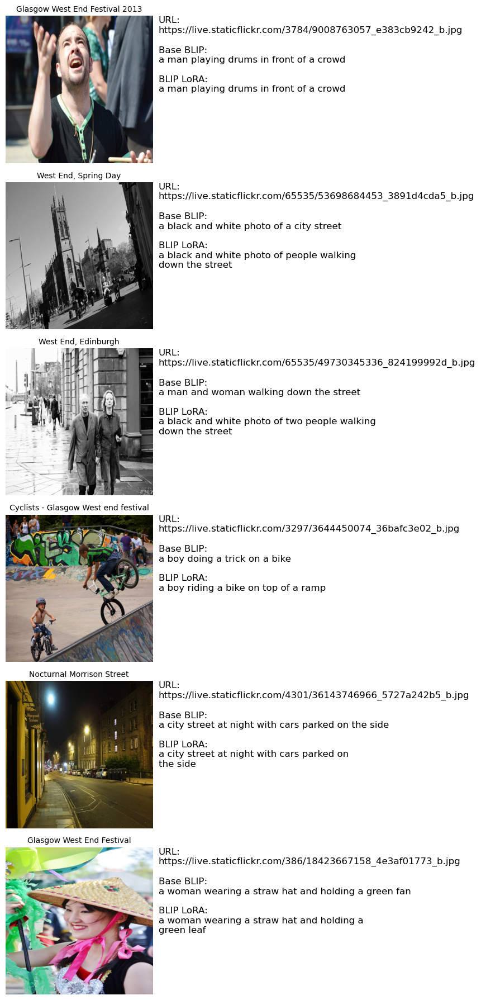

In [61]:
import requests
import io
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import textwrap

# Use whichever DF you want to sample from
df_plot = test_df.reset_index(drop=True)   # or df_yorkhill

def load_image_from_url(url, size=(400, 400)):
    resp = requests.get(url, timeout=10)
    resp.raise_for_status()
    img = Image.open(io.BytesIO(resp.content)).convert("RGB")
    if size is not None:
        img = img.resize(size)
    return img

# how many examples to show
n_examples = 6
indices = np.random.choice(len(df_plot), size=n_examples, replace=False)

fig, axes = plt.subplots(n_examples, 2, figsize=(10, 3 * n_examples))
if n_examples == 1:
    axes = np.array([axes])  # handle 1-row edge case

for row_idx, idx in enumerate(indices):
    row = df_plot.iloc[idx]
    url   = row["url_l"]
    title = str(row.get("title", ""))

    # --- load image ---
    try:
        img = load_image_from_url(url)
    except Exception as e:
        img = Image.new("RGB", (250, 250), color=(255, 255, 255))
        title = f"[image load error] {title}"

    # --- generate captions (no prompt or neutral prompt) ---
    try:
        base_cap = generate_caption(base_model, url, prompt="")
    except Exception as e:
        base_cap = f"[error: {e}]"

    try:
        york_cap = generate_caption(yorkhill_model, url, prompt="")
    except Exception as e:
        york_cap = f"[error: {e}]"

    # left: image
    ax_img = axes[row_idx, 0]
    ax_img.imshow(img)
    ax_img.axis("off")
    ax_img.set_title(title, fontsize=10)

    # right: "table-style" captions
    ax_txt = axes[row_idx, 1]
    ax_txt.axis("off")

    # wrap text so it fits nicely
    base_wrapped = "\n".join(textwrap.wrap(base_cap, width=65))
    york_wrapped = "\n".join(textwrap.wrap(york_cap, width=45))

    text = (
        f"URL:\n{url}\n\n"
        f"Base BLIP:\n{base_wrapped}\n\n"
        f"BLIP LoRA:\n{york_wrapped}"
    )
    ax_txt.text(
        0.0, 1.0,
        text,
        fontsize=12,
        va="top",
        ha="left",
    )

plt.tight_layout()
plt.show()
